# Тема 6. Класифікація природних сцен (Intel Image Classification)

PyTorch, GPU на Kaggle: **власна CNN** і **transfer learning (ResNet18)**.


## 1. Імпорт бібліотек і відтворюваність

Фіксований seed, щоб спліт train/val і ініціалізація ваг були відтворюваними.


In [ ]:
import os
import random
import warnings
from collections import Counter
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
)
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import datasets, models, transforms
from torchvision.utils import make_grid
from IPython.display import display
from tqdm.auto import tqdm

warnings.filterwarnings("ignore")
sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (7, 4)
plt.rcParams["axes.titlesize"] = 11
plt.rcParams["axes.labelsize"] = 10

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

torch.backends.cudnn.enabled = False
torch.backends.cudnn.benchmark = False


def probe_cuda_conv():
    """True, якщо на GPU реально проходить Conv2d (не лише cuda.is_available())."""
    if not torch.cuda.is_available():
        return False
    try:
        x = torch.zeros(1, 3, 16, 16, device="cuda")
        conv = nn.Conv2d(3, 4, 3, padding=1).to("cuda")
        y = conv(x)
        torch.cuda.synchronize()
        del x, y, conv
        torch.cuda.empty_cache()
        return True
    except Exception as exc:
        print(f"CUDA Conv2d probe failed: {type(exc).__name__}: {exc}")
        torch.cuda.empty_cache()
        return False


if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    gpu_name = torch.cuda.get_device_name(0)
    cap = torch.cuda.get_device_capability(0)
    print(f"GPU: {gpu_name} | compute {cap[0]}.{cap[1]} | CUDA {torch.version.cuda}")

if probe_cuda_conv():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    if torch.cuda.is_available():
        print(
            "GPU видимий, але Conv2d на ньому не виконується "
            "(типово P100 vs новий PyTorch).\n"
            "Restart session → Session options → Accelerator → GPU T4 → Run All."
        )

print(f"Пристрій: {device}")
print(f"PyTorch: {torch.__version__}")


GPU: Tesla T4 | compute 7.5 | CUDA 12.8
Пристрій: cuda
PyTorch: 2.10.0+cu128


## 2. Завантаження даних

Intel Image Classification (~25 тис. зображень 150×150, 6 класів природних сцен):
`buildings`, `forest`, `glacier`, `mountain`, `sea`, `street`.

Організація на Kaggle: `seg_train` / `seg_test` уже розділені. Валідацію відрізаємо від навчальної частини (20%), як вимагає умова.


In [6]:
KAGGLE_ROOT = Path("/kaggle/input/datasets/puneet6060/intel-image-classification")
TRAIN_DIR = KAGGLE_ROOT / "seg_train" / "seg_train"
TEST_DIR = KAGGLE_ROOT / "seg_test" / "seg_test"

if not TRAIN_DIR.exists():
    raise FileNotFoundError(
        "Датасет не знайдено. На Kaggle: Add Input → puneet6060/intel-image-classification.\n"
        f"Очікуваний шлях: {TRAIN_DIR}"
    )

# Без трансформів — PIL-зображення; трансформи накладемо після спліту, окремо для train/val.
base_train = datasets.ImageFolder(TRAIN_DIR)
test_raw = datasets.ImageFolder(TEST_DIR)

CLASS_NAMES = base_train.classes
NUM_CLASSES = len(CLASS_NAMES)
print("Класи:", CLASS_NAMES)
print(f"Навчальних зображень (до val-спліту): {len(base_train)}")
print(f"Тестових зображень: {len(test_raw)}")


Класи: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Навчальних зображень (до val-спліту): 14034
Тестових зображень: 3000


## 3. Попередня обробка і розподіл на train / val / test

**Спліт.** `random_split` 80/20 від `seg_train` з `Generator().manual_seed(42)`. Тест лишається офіційним `seg_test`.

**Трансформи.** ImageNet mean/std — однакова нормалізація для CNN і ResNet, щоб pretrained-ваги працювали коректно.

- CNN: Resize 150×150 (нативний розмір датасету).
- ResNet18: Resize 256 → crop 224 (як у лекції 6 / ImageNet).
- Train only: `RandomHorizontalFlip` + легкий `ColorJitter` (аугментація).
- Val/test без аугментації, щоб метрики були стабільними.

Різні трансформи на одному спліті індексів: обгортка `TransformSubset`.


In [9]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_tf_cnn = transforms.Compose(
    [
        transforms.Resize((150, 150)),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.1),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)
eval_tf_cnn = transforms.Compose(
    [
        transforms.Resize((150, 150)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)
train_tf_resnet = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.RandomCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.1),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)
eval_tf_resnet = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ]
)


class TransformSubset(Dataset):
    """Subset + окремий transform (PIL → тензор)."""

    def __init__(self, subset, transform):
        self.subset = subset
        self.transform = transform

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        img, label = self.subset[idx]
        if self.transform is not None:
            img = self.transform(img)
        return img, label


VAL_FRACTION = 0.20
n_total = len(base_train)
n_val = int(VAL_FRACTION * n_total)
n_train = n_total - n_val
train_base, val_base = random_split(
    base_train,
    [n_train, n_val],
    generator=torch.Generator().manual_seed(SEED),
)

train_cnn = TransformSubset(train_base, train_tf_cnn)
val_cnn = TransformSubset(val_base, eval_tf_cnn)
test_cnn = datasets.ImageFolder(TEST_DIR, transform=eval_tf_cnn)
train_cnn_eval = TransformSubset(train_base, eval_tf_cnn)

train_resnet = TransformSubset(train_base, train_tf_resnet)
val_resnet = TransformSubset(val_base, eval_tf_resnet)
test_resnet = datasets.ImageFolder(TEST_DIR, transform=eval_tf_resnet)
train_resnet_eval = TransformSubset(train_base, eval_tf_resnet)

BATCH_SIZE = 64
NUM_WORKERS = 2
PIN_MEMORY = device.type == "cuda"


def make_loader(dataset, shuffle):
    return DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
    )


loaders_cnn = {
    "train": make_loader(train_cnn, True),
    "val": make_loader(val_cnn, False),
    "test": make_loader(test_cnn, False),
}
loaders_resnet = {
    "train": make_loader(train_resnet, True),
    "val": make_loader(val_resnet, False),
    "test": make_loader(test_resnet, False),
}
# Оцінка/візуалізація train без аугментації (інакше метрики шумітимуть).
eval_loaders_cnn = {
    "train": make_loader(train_cnn_eval, False),
    "val": loaders_cnn["val"],
    "test": loaders_cnn["test"],
}
eval_loaders_resnet = {
    "train": make_loader(train_resnet_eval, False),
    "val": loaders_resnet["val"],
    "test": loaders_resnet["test"],
}

print(f"train: {n_train} | val: {n_val} | test: {len(test_cnn)}")
print(f"batch_size={BATCH_SIZE}, num_workers={NUM_WORKERS}")


train: 11228 | val: 2806 | test: 3000
batch_size=64, num_workers=2


## 4. Огляд даних (EDA)

Баланс класів і візуальна перевірка батча після денормалізації.


,train,val,test,усього
buildings,1783,408,437,2628
forest,1818,453,474,2745
glacier,1934,470,553,2957
mountain,2039,473,525,3037
sea,1787,487,510,2784
street,1867,515,501,2883


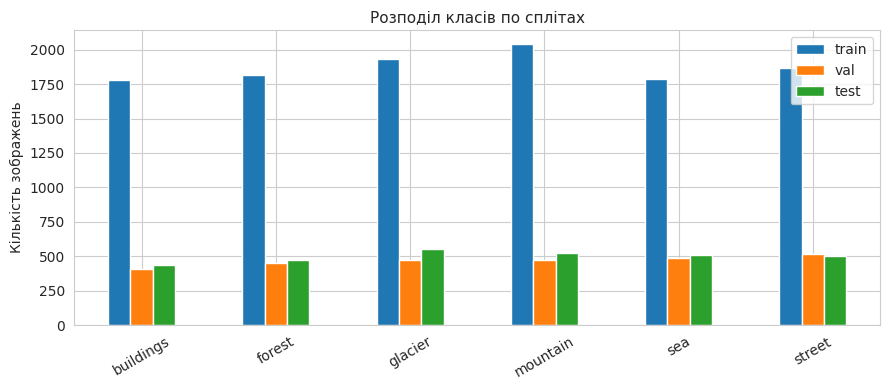

In [10]:
def class_counts_from_subset(subset):
    targets = [subset.dataset.targets[i] for i in subset.indices]
    counts = Counter(targets)
    return {CLASS_NAMES[i]: counts.get(i, 0) for i in range(NUM_CLASSES)}


def class_counts_from_folder(ds):
    counts = Counter(ds.targets)
    return {CLASS_NAMES[i]: counts.get(i, 0) for i in range(NUM_CLASSES)}


eda = pd.DataFrame(
    {
        "train": class_counts_from_subset(train_base),
        "val": class_counts_from_subset(val_base),
        "test": class_counts_from_folder(test_cnn),
    }
)
eda["усього"] = eda.sum(axis=1)
display(eda)

ax = eda[["train", "val", "test"]].plot(kind="bar", figsize=(9, 4))
ax.set_title("Розподіл класів по сплітах")
ax.set_ylabel("Кількість зображень")
ax.tick_params(axis="x", rotation=30)
plt.tight_layout()
plt.show()


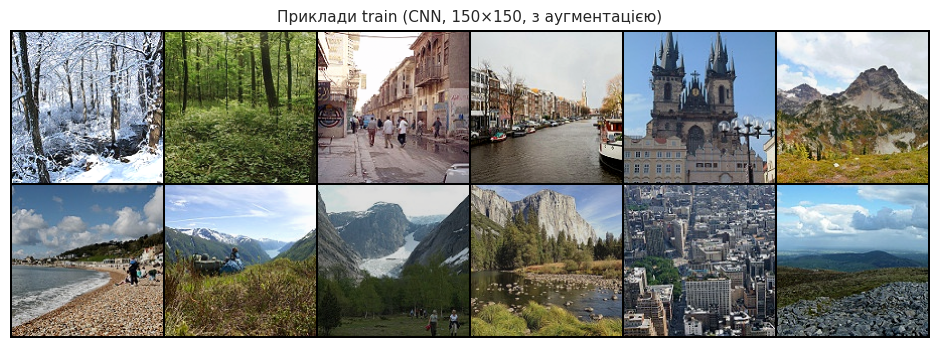

Мітки: ['forest', 'forest', 'street', 'street', 'buildings', 'mountain', 'sea', 'mountain', 'glacier', 'mountain', 'buildings', 'mountain']


In [11]:
def denormalize(img_tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    img = img_tensor.cpu() * std + mean
    return img.clamp(0, 1)


images, labels = next(iter(loaders_cnn["train"]))
grid = make_grid(denormalize(images[:12]), nrow=6)
plt.figure(figsize=(12, 4))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis("off")
plt.title("Приклади train (CNN, 150×150, з аугментацією)")
plt.show()
print("Мітки:", [CLASS_NAMES[i] for i in labels[:12].tolist()])


## 5. Функція втрат, оптимізатор, метрики — обґрунтування

### Функція втрат — `nn.CrossEntropyLoss`
Багатокласова класифікація (6 взаємовиключних класів). `CrossEntropyLoss` поєднує `LogSoftmax` і `NLLLoss`, тож модель повертає **logits** без softmax. Класи майже збалансовані, тому ваги класів не потрібні.

### Оптимізатор — Adam (`lr=1e-3`)
Адаптивний крок добре працює і для навчання CNN з нуля, і для голови ResNet. Під час fine-tune `layer4` зменшуємо lr до `1e-4`, щоб не зруйнувати ImageNet-ознаки.

### Метрики
- **Accuracy** — зрозуміла загальна якість; класи приблизно рівні, тож не вводить в оману.
- **Weighted / macro F1** — ловить просідання окремих класів (типово *glacier* ↔ *mountain*).
- `classification_report` — precision/recall по кожному класу.

### Гіперпараметри (під Kaggle GPU)
| Параметр | CNN | ResNet18 |
|---|---|---|
| Вхід | 150×150 | 224×224 |
| Batch | 64 | 64 |
| Епохи | 12 | 6 freeze + 4 fine-tune `layer4` |
| lr | 1e-3 | 1e-3 (fc), потім 1e-4 (`layer4`) |
| Чекпоінт | найменший **val loss** | те саме |


## 6. Спільні утиліти навчання та оцінки

Один цикл для обох моделей: train/val loss і accuracy, збереження найкращих ваг, збір предиктів, криві, матриця помилок, сітки «факт / прогноз» і помилкові приклади.


In [12]:
def run_epoch(model, loader, criterion, optimizer=None):
    is_train = optimizer is not None
    model.train(is_train)
    running_loss = 0.0
    correct = 0
    total = 0
    context = torch.enable_grad() if is_train else torch.no_grad()
    with context:
        for inputs, labels in tqdm(loader, leave=False):
            inputs = inputs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            if is_train:
                optimizer.zero_grad(set_to_none=True)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            if is_train:
                loss.backward()
                optimizer.step()
            running_loss += loss.item() * inputs.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return running_loss / total, correct / total


def train_one_model(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    num_epochs,
    ckpt_path,
    history=None,
    best_val_loss=None,
):
    if history is None:
        history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}
    if best_val_loss is None:
        best_val_loss = float("inf")

    for epoch in range(num_epochs):
        tr_loss, tr_acc = run_epoch(model, train_loader, criterion, optimizer)
        va_loss, va_acc = run_epoch(model, val_loader, criterion, optimizer=None)
        history["train_loss"].append(tr_loss)
        history["train_acc"].append(tr_acc)
        history["val_loss"].append(va_loss)
        history["val_acc"].append(va_acc)
        marker = ""
        if va_loss < best_val_loss:
            best_val_loss = va_loss
            torch.save(model.state_dict(), ckpt_path)
            marker = "  ← best"
        print(
            f"Epoch {epoch + 1:02d}/{num_epochs} | "
            f"train loss {tr_loss:.4f} acc {tr_acc:.4f} | "
            f"val loss {va_loss:.4f} acc {va_acc:.4f}{marker}"
        )
    return history, best_val_loss


def load_best(model, ckpt_path):
    try:
        state = torch.load(ckpt_path, map_location=device, weights_only=True)
    except TypeError:
        state = torch.load(ckpt_path, map_location=device)
    model.load_state_dict(state)
    model.eval()
    return model


def collect_preds(model, loader):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device, non_blocking=True))
            y_pred.extend(outputs.argmax(1).cpu().numpy())
            y_true.extend(labels.numpy())
    return np.asarray(y_true), np.asarray(y_pred)


def metrics_dict(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted"),
        "f1_macro": f1_score(y_true, y_pred, average="macro"),
    }


def evaluate_splits(model, loaders, title):
    rows = []
    preds = {}
    print(f"\n=== {title} ===")
    for split, loader in loaders.items():
        y_true, y_pred = collect_preds(model, loader)
        preds[split] = (y_true, y_pred)
        m = metrics_dict(y_true, y_pred)
        rows.append({"split": split, **m})
        print(f"\n[{split}]")
        print(
            classification_report(
                y_true, y_pred, target_names=CLASS_NAMES, digits=4, zero_division=0
            )
        )
    table = pd.DataFrame(rows).set_index("split")
    display(table.round(4))
    return table, preds


def plot_history(history, title):
    epochs = range(1, len(history["train_loss"]) + 1)
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(epochs, history["train_loss"], label="train")
    axes[0].plot(epochs, history["val_loss"], label="val")
    axes[0].set_title(f"{title}: loss")
    axes[0].set_xlabel("epoch")
    axes[0].legend()
    axes[1].plot(epochs, history["train_acc"], label="train")
    axes[1].plot(epochs, history["val_acc"], label="val")
    axes[1].set_title(f"{title}: accuracy")
    axes[1].set_xlabel("epoch")
    axes[1].legend()
    plt.tight_layout()
    plt.show()


def plot_confusion(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 6))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=CLASS_NAMES,
        yticklabels=CLASS_NAMES,
    )
    plt.title(title)
    plt.ylabel("Факт")
    plt.xlabel("Прогноз")
    plt.tight_layout()
    plt.show()


def show_predictions(model, loader, title, num_images=8):
    model.eval()
    shown = 0
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.ravel()
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = outputs.argmax(1).cpu()
            for j in range(inputs.size(0)):
                if shown >= num_images:
                    break
                ax = axes[shown]
                ax.imshow(denormalize(inputs[j]).permute(1, 2, 0).numpy())
                ax.axis("off")
                ok = preds[j] == labels[j]
                color = "green" if ok else "red"
                ax.set_title(
                    f"факт: {CLASS_NAMES[labels[j]]}\nпрогноз: {CLASS_NAMES[preds[j]]}",
                    color=color,
                    fontsize=9,
                )
                shown += 1
            if shown >= num_images:
                break
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


def show_errors(model, loader, title, num_images=8):
    model.eval()
    shown = 0
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.ravel()
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.to(device))
            preds = outputs.argmax(1).cpu()
            for j in range(inputs.size(0)):
                if shown >= num_images:
                    break
                if preds[j] == labels[j]:
                    continue
                ax = axes[shown]
                ax.imshow(denormalize(inputs[j]).permute(1, 2, 0).numpy())
                ax.axis("off")
                ax.set_title(
                    f"факт: {CLASS_NAMES[labels[j]]}\nпрогноз: {CLASS_NAMES[preds[j]]}",
                    color="red",
                    fontsize=9,
                )
                shown += 1
            if shown >= num_images:
                break
    for k in range(shown, num_images):
        axes[k].axis("off")
    fig.suptitle(title if shown else title + " (помилок у батчах не знайдено)")
    plt.tight_layout()
    plt.show()


## 7. Варіант A — проста згорткова мережа

Архітектура близька до baseline з лекції 5 і до Kaggle-прикладів (фрукти / карти):

- 3 блоки `Conv2d → BatchNorm2d → ReLU → MaxPool2d` (32 → 64 → 128 каналів, kernel 3, padding 1).
- Після трьох пулінгів 150×150 → 18×18; розмір FC рахуємо dummy-forward.
- `Linear(·, 512) → ReLU → Dropout(0.3) → Linear(512, 6)`.
- Softmax **немає**: його вже містить `CrossEntropyLoss`.

**Чому так.** Три згортки дають ієрархію ознак без зайвої глибини (датасет середній, навчання з нуля). BatchNorm стабілізує градієнти, Dropout трохи зменшує перенавчання FC.

**Обмеження.** Мало шарів порівняно з ResNet; receptive field обмежений; немає skip-connections; ознаки вчаться з нуля, тож на тонких відмінностях (*glacier* / *mountain*) точність нижча.


In [13]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=6, img_size=150):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.3)

        with torch.no_grad():
            n_features = self._forward_conv(torch.zeros(1, 3, img_size, img_size)).numel()
        self.fc1 = nn.Linear(n_features, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _forward_conv(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        return x

    def forward(self, x):
        x = self._forward_conv(x)
        x = torch.flatten(x, 1)
        x = self.dropout(F.relu(self.fc1(x)))
        return self.fc2(x)


cnn = SimpleCNN(num_classes=NUM_CLASSES).to(device)
print(cnn)
n_params = sum(p.numel() for p in cnn.parameters() if p.requires_grad)
print(f"Навчальних параметрів: {n_params:,}")


SimpleCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=41472, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=6, bias=True)
)
Навчальних параметрів: 21,330,950


In [14]:
criterion = nn.CrossEntropyLoss()
cnn_optimizer = optim.Adam(cnn.parameters(), lr=1e-3)
CNN_EPOCHS = 12
CNN_CKPT = "best_cnn.pth"

print(f"Навчання SimpleCNN: {CNN_EPOCHS} епох, Adam lr=1e-3")
cnn_history, _ = train_one_model(
    cnn,
    loaders_cnn["train"],
    loaders_cnn["val"],
    criterion,
    cnn_optimizer,
    num_epochs=CNN_EPOCHS,
    ckpt_path=CNN_CKPT,
)
cnn = load_best(cnn, CNN_CKPT)


Навчання SimpleCNN: 12 епох, Adam lr=1e-3


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 01/12 | train loss 2.2444 acc 0.5373 | val loss 0.8091 acc 0.7028  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 02/12 | train loss 0.8659 acc 0.6787 | val loss 0.7082 acc 0.7434  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 03/12 | train loss 0.7165 acc 0.7400 | val loss 0.5984 acc 0.7805  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 04/12 | train loss 0.6568 acc 0.7624 | val loss 0.7548 acc 0.7441


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
 Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0> 
Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
      self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^^    ^if w.is_alive():^^
^  ^ ^ ^^ 
   File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
 ^^    ^^^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^^^ 
  File "/usr/lib/py

Epoch 05/12 | train loss 0.6245 acc 0.7771 | val loss 0.5473 acc 0.7972  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 06/12 | train loss 0.5755 acc 0.7971 | val loss 0.5697 acc 0.7929


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 07/12 | train loss 0.5779 acc 0.7955 | val loss 0.5562 acc 0.8079


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 08/12 | train loss 0.5422 acc 0.8062 | val loss 0.5208 acc 0.8193  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 09/12 | train loss 0.5255 acc 0.8139 | val loss 0.4755 acc 0.8318  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 10/12 | train loss 0.5142 acc 0.8232 | val loss 0.5095 acc 0.8232


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0>Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()    
self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

      File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
if w.is_alive():
     if w.is_alive(): 
            ^^^^^^^^^^^^^^^^^^^^^^^^

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
        assert self.

Epoch 11/12 | train loss 0.4691 acc 0.8310 | val loss 0.4825 acc 0.8368


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 12/12 | train loss 0.4638 acc 0.8310 | val loss 0.5942 acc 0.8043



=== SimpleCNN ===

[train]
              precision    recall  f1-score   support

   buildings     0.8305    0.8985    0.8631      1783
      forest     0.9640    0.9714    0.9677      1818
     glacier     0.8568    0.8102    0.8328      1934
    mountain     0.7965    0.8637    0.8287      2039
         sea     0.8882    0.8495    0.8684      1787
      street     0.9156    0.8425    0.8775      1867

    accuracy                         0.8717     11228
   macro avg     0.8753    0.8726    0.8731     11228
weighted avg     0.8738    0.8717    0.8718     11228


[val]
              precision    recall  f1-score   support

   buildings     0.7402    0.8799    0.8040       408
      forest     0.9559    0.9581    0.9570       453
     glacier     0.8172    0.7702    0.7930       470
    mountain     0.7466    0.8161    0.7798       473
         sea     0.8495    0.8111    0.8298       487
      street     0.9005    0.7728    0.8318       515

    accuracy                         0.831

,accuracy,f1_weighted,f1_macro
split,,,
train,0.8717,0.8718,0.8731
val,0.8318,0.8324,0.8326
test,0.8397,0.8400,0.8415


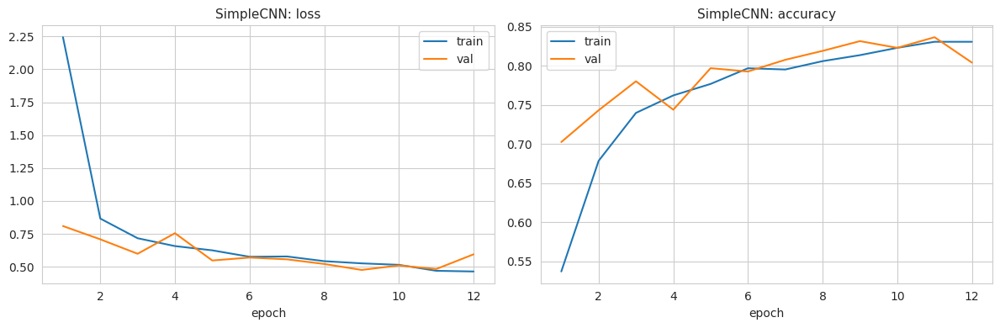

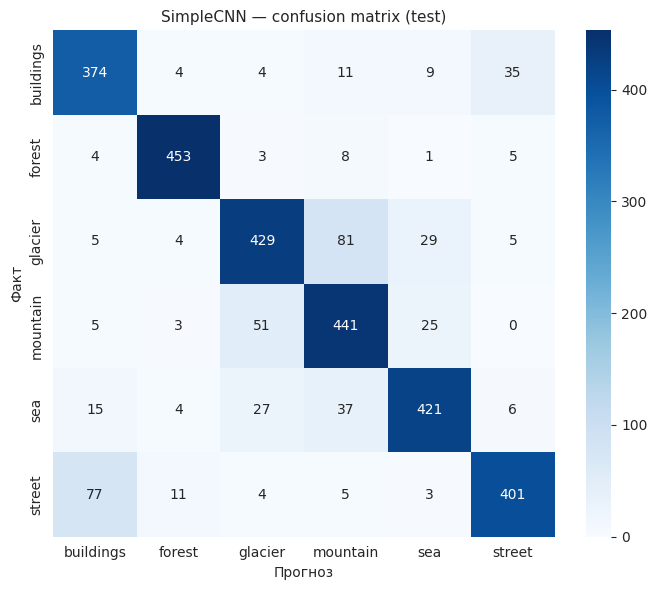

In [15]:
cnn_table, cnn_preds = evaluate_splits(cnn, eval_loaders_cnn, "SimpleCNN")
plot_history(cnn_history, "SimpleCNN")
plot_confusion(*cnn_preds["test"], "SimpleCNN — confusion matrix (test)")


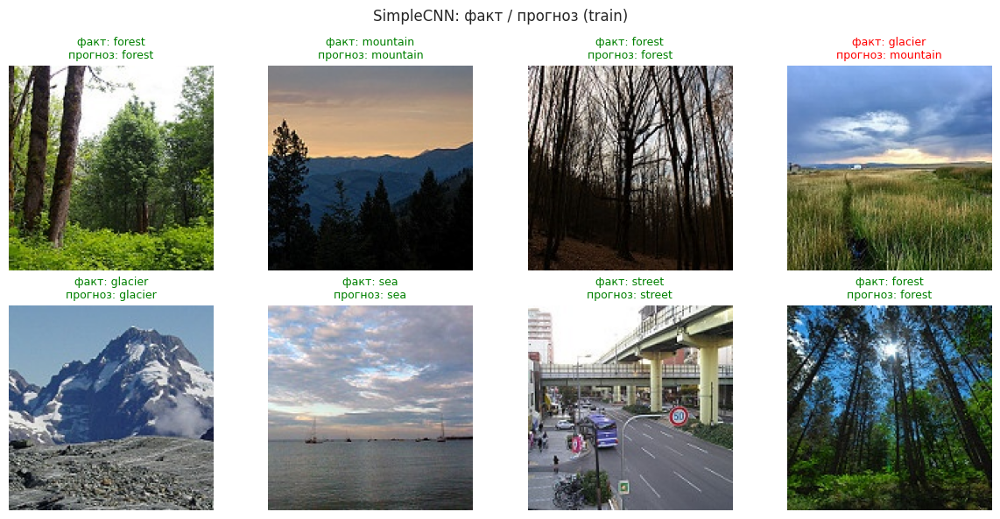

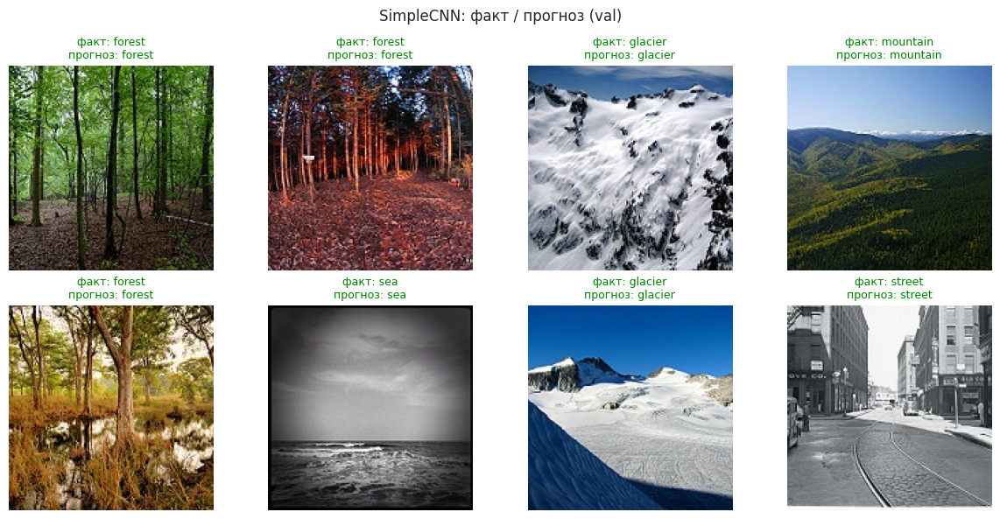

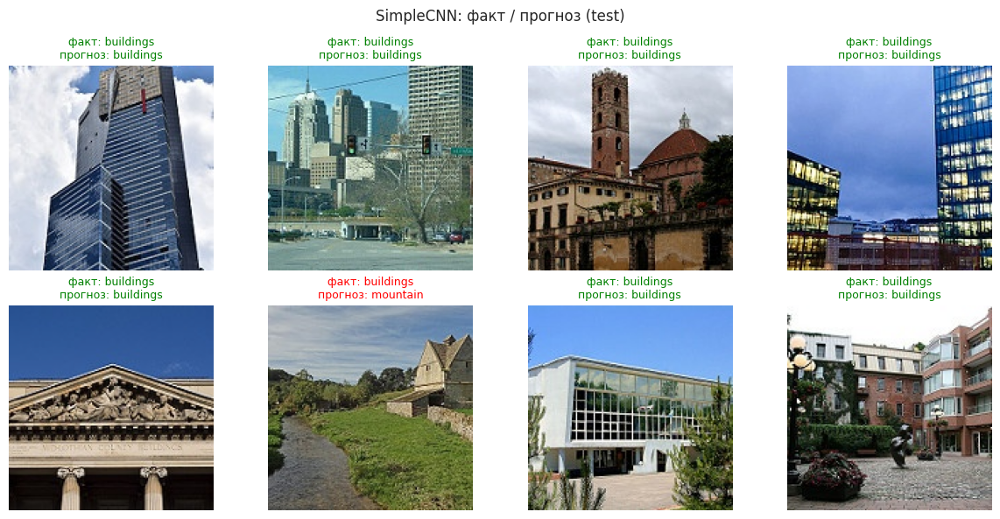

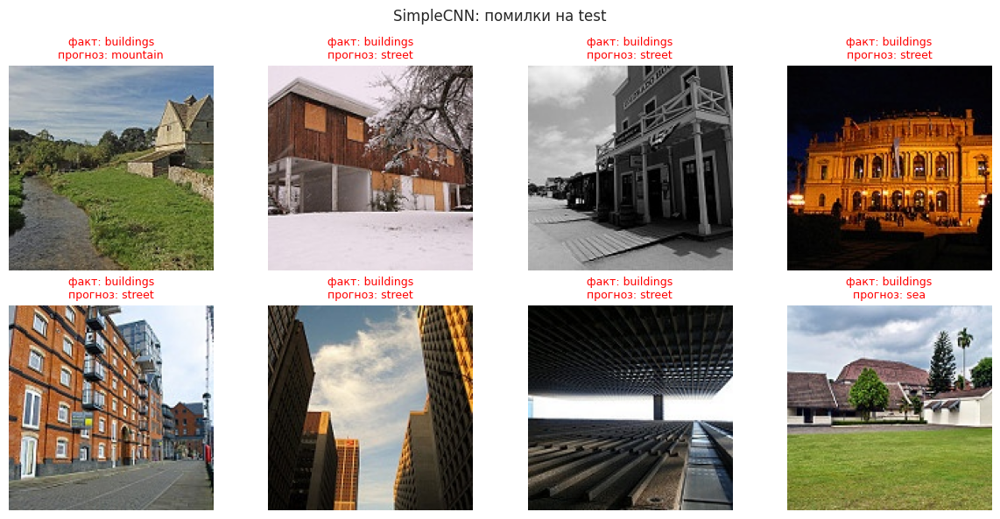

In [16]:
for split in ("train", "val", "test"):
    show_predictions(cnn, eval_loaders_cnn[split], f"SimpleCNN: факт / прогноз ({split})")
show_errors(cnn, eval_loaders_cnn["test"], "SimpleCNN: помилки на test")


### Інтерпретація SimpleCNN

Орієнтир умови: accuracy **75–85%**, F1 **0.73–0.83**. На **test** модель дала **accuracy 84.0%**, weighted F1 **0.840**, macro F1 **0.842** — верхня межа очікуваного діапазону.

Чекпоінт — епоха 9 (val loss 0.476, val acc 83.2%). Train **87.2%** vs val **83.2%** / test **84.0%**: невелике перенавчання (~3 в.п.), Dropout і аугментація його стримують.

По класах на test (F1): **forest 0.951** найлегший; **sea 0.844**, **street 0.842**, **buildings 0.816**; найслабші **glacier 0.801** і **mountain 0.796**. Плутанина glacier ↔ mountain і buildings ↔ street підтверджується матрицею помилок.


## 8. Варіант B — transfer learning (ResNet18)

Як у лекції 6 і в прикладі умови: `resnet18(weights=IMAGENET1K_V1)`.

**Стратегія (два етапи, експеримент з гіперпараметрами / шарами):**

1. Заморозити весь backbone, замінити `fc` на `Linear(num_ftrs, 6)`, навчати лише голову, Adam `lr=1e-3`, 6 епох.
2. Розморозити `layer4` (найглибший блок), Adam з `lr=1e-4` для `layer4` і `1e-3` для `fc`, ще 4 епохи. Ранні шари лишаються замороженими — зберігаємо низькорівневі ImageNet-фільтри.

Чекпоінт як і для CNN: мінімальний val loss (фаза 2 перезаписує файл лише якщо стала кращою).


In [19]:
resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
for param in resnet.parameters():
    param.requires_grad = False
num_ftrs = resnet.fc.in_features
resnet.fc = nn.Linear(num_ftrs, NUM_CLASSES)
resnet = resnet.to(device)

print(resnet.fc)
trainable = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
total = sum(p.numel() for p in resnet.parameters())
print(f"Навчальних параметрів (лише fc): {trainable:,} / {total:,}")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 134MB/s] 


Linear(in_features=512, out_features=6, bias=True)
Навчальних параметрів (лише fc): 3,078 / 11,179,590


In [20]:
RESNET_CKPT = "best_resnet18.pth"
criterion = nn.CrossEntropyLoss()

opt_head = optim.Adam(resnet.fc.parameters(), lr=1e-3)
print("Фаза 1: freeze backbone, train fc, 6 епох")
resnet_history, best_val = train_one_model(
    resnet,
    loaders_resnet["train"],
    loaders_resnet["val"],
    criterion,
    opt_head,
    num_epochs=6,
    ckpt_path=RESNET_CKPT,
)

resnet = load_best(resnet, RESNET_CKPT)
for param in resnet.layer4.parameters():
    param.requires_grad = True

opt_ft = optim.Adam(
    [
        {"params": resnet.layer4.parameters(), "lr": 1e-4},
        {"params": resnet.fc.parameters(), "lr": 1e-3},
    ]
)
print("Фаза 2: fine-tune layer4 + fc, 4 епохи")
resnet_history, _ = train_one_model(
    resnet,
    loaders_resnet["train"],
    loaders_resnet["val"],
    criterion,
    opt_ft,
    num_epochs=4,
    ckpt_path=RESNET_CKPT,
    history=resnet_history,
    best_val_loss=best_val,
)
resnet = load_best(resnet, RESNET_CKPT)


Фаза 1: freeze backbone, train fc, 6 епох


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 01/6 | train loss 0.6086 acc 0.8107 | val loss 0.3437 acc 0.8842  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 02/6 | train loss 0.3369 acc 0.8854 | val loss 0.2943 acc 0.8999  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 03/6 | train loss 0.3055 acc 0.8922 | val loss 0.2777 acc 0.9016  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 04/6 | train loss 0.2895 acc 0.8971 | val loss 0.2887 acc 0.8974


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a1ae2ba31a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1653, in _shutdown_workers
    self._pin_memory_thread.join()
  File "/usr/lib/python3.12/threading.py", line 1146, in join
    raise RuntimeError("cannot join current thread")
RuntimeError: cannot join current thread
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^Exception ignored in: ^^<function _M

Epoch 05/6 | train loss 0.2730 acc 0.9040 | val loss 0.2545 acc 0.9102  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 06/6 | train loss 0.2687 acc 0.9024 | val loss 0.2572 acc 0.9048
Фаза 2: fine-tune layer4 + fc, 4 епохи


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 01/4 | train loss 0.2595 acc 0.9070 | val loss 0.1999 acc 0.9273  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 02/4 | train loss 0.1532 acc 0.9455 | val loss 0.2089 acc 0.9330


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 03/4 | train loss 0.1154 acc 0.9588 | val loss 0.1976 acc 0.9319  ← best


  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

Epoch 04/4 | train loss 0.0879 acc 0.9660 | val loss 0.2250 acc 0.9280



=== ResNet18 ===

[train]
              precision    recall  f1-score   support

   buildings     0.9817    0.9905    0.9860      1783
      forest     0.9994    0.9928    0.9961      1818
     glacier     0.9661    0.9721    0.9691      1934
    mountain     0.9771    0.9627    0.9699      2039
         sea     0.9851    1.0000    0.9925      1787
      street     0.9903    0.9834    0.9868      1867

    accuracy                         0.9830     11228
   macro avg     0.9833    0.9836    0.9834     11228
weighted avg     0.9830    0.9830    0.9830     11228


[val]
              precision    recall  f1-score   support

   buildings     0.8973    0.9632    0.9291       408
      forest     0.9978    0.9845    0.9911       453
     glacier     0.8773    0.8979    0.8875       470
    mountain     0.9013    0.8689    0.8848       473
         sea     0.9551    0.9610    0.9580       487
      street     0.9615    0.9223    0.9415       515

    accuracy                         0.9319

,accuracy,f1_weighted,f1_macro
split,,,
train,0.9830,0.9830,0.9834
val,0.9319,0.9320,0.9320
test,0.9310,0.9308,0.9322


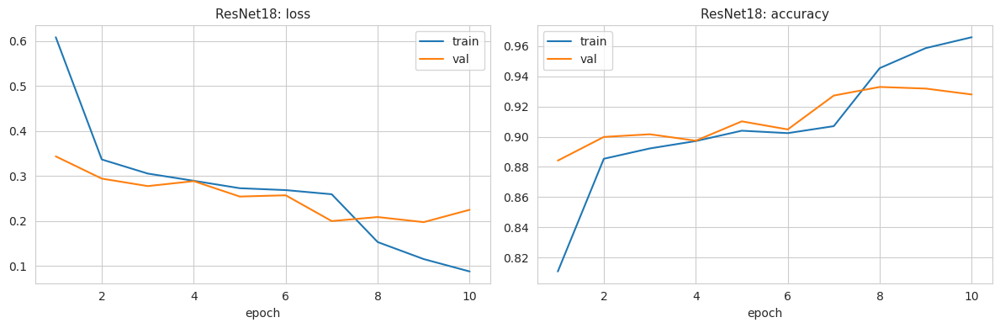

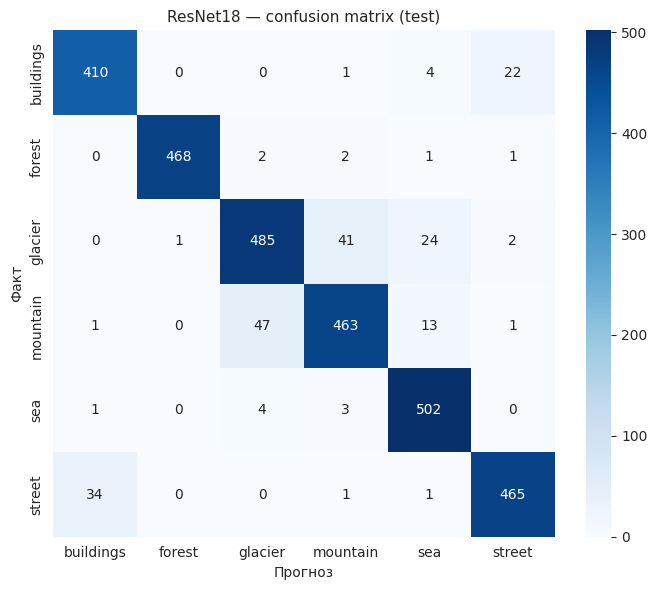

In [21]:
resnet_table, resnet_preds = evaluate_splits(resnet, eval_loaders_resnet, "ResNet18")
plot_history(resnet_history, "ResNet18")
plot_confusion(*resnet_preds["test"], "ResNet18 — confusion matrix (test)")


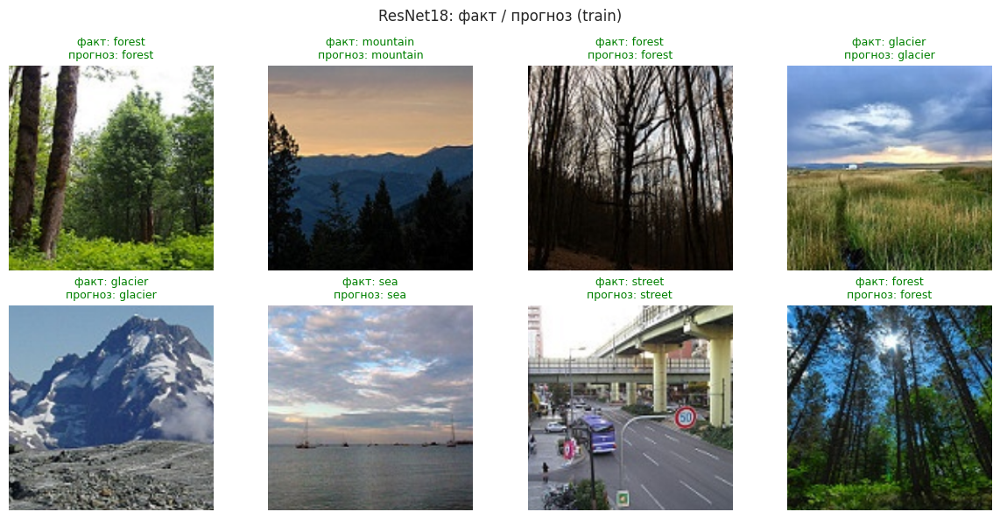

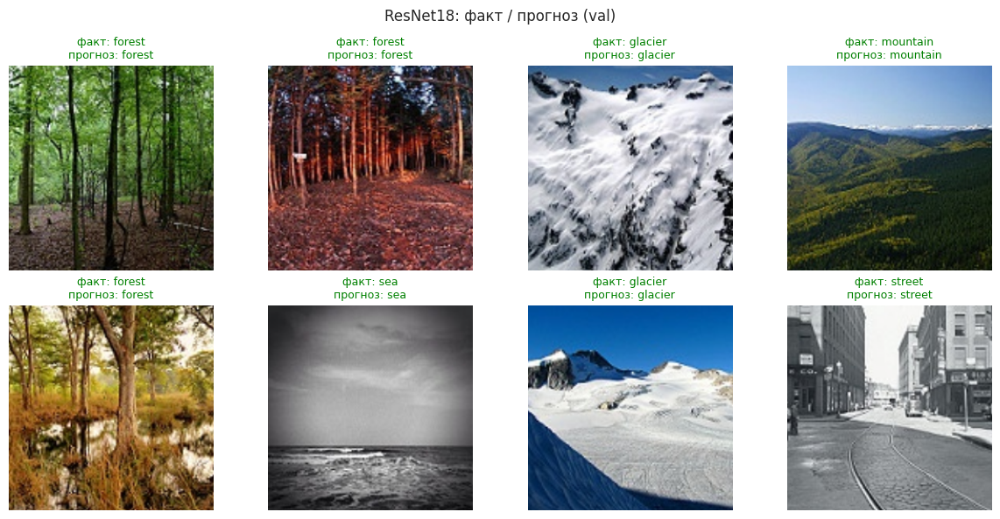

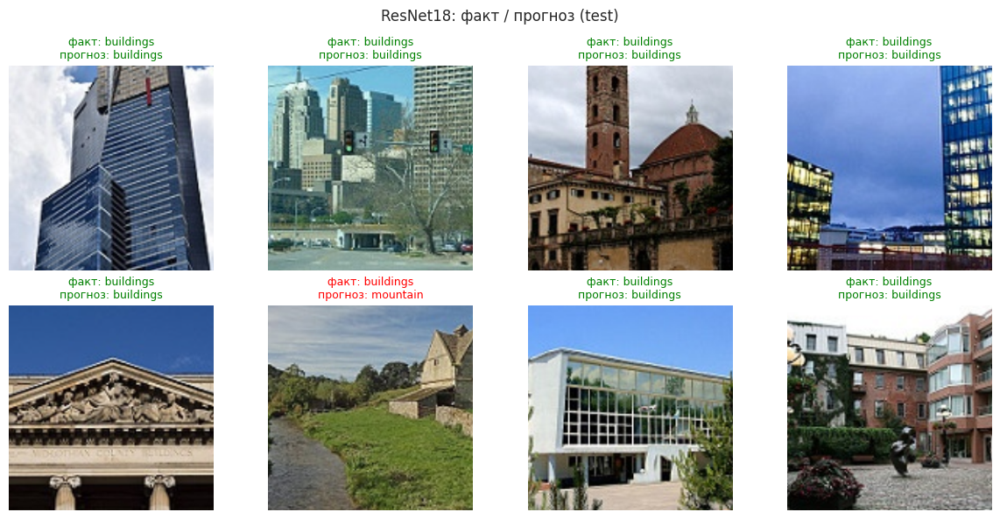

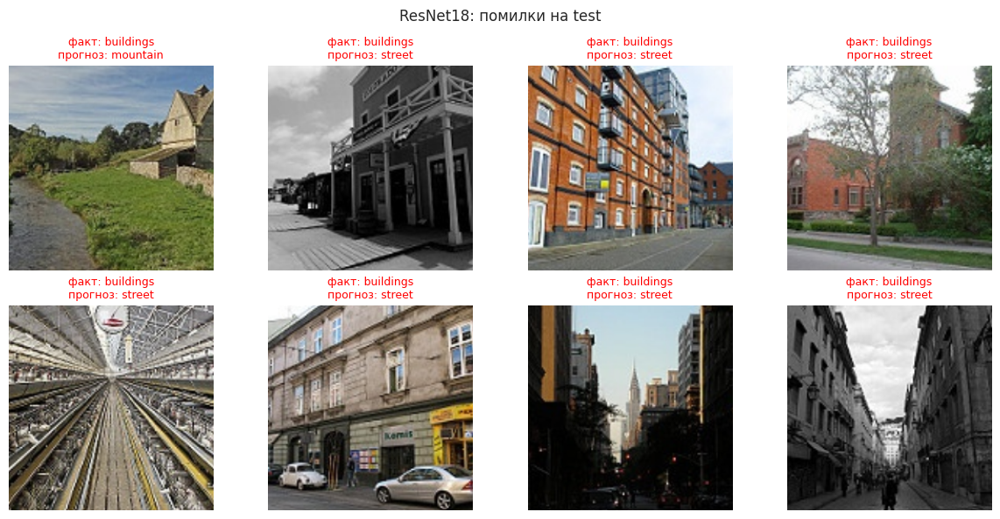

In [22]:
for split in ("train", "val", "test"):
    show_predictions(resnet, eval_loaders_resnet[split], f"ResNet18: факт / прогноз ({split})")
show_errors(resnet, eval_loaders_resnet["test"], "ResNet18: помилки на test")


### Інтерпретація ResNet18

Орієнтир умови: accuracy **90–97%**, F1 **0.89–0.96**. На **test**: **accuracy 93.1%**, weighted F1 **0.931**, macro F1 **0.932** — середина очікуваного діапазону, на **~9.1 в.п.** вище за SimpleCNN.

**Фаза 1 (freeze, 6 епох):** best val на епосі 5 — loss 0.255, acc **91.0%**.  
**Фаза 2 (fine-tune `layer4`, 4 епохи):** val loss знизився до **0.198** (епоха 3), val acc **93.2%**. Fine-tune спрацював.

Train **98.3%** vs val/test **~93.1%**: після розморожування `layer4` з’явився розрив (~5 в.п.), але узагальнення лишається сильним.

На test найкращий клас — **forest (F1 0.993)**; **sea 0.952**, **street 0.938**, **buildings 0.929**. Найслабші знову **mountain 0.894** і **glacier 0.889** — візуальне перекриття в даних, не лише в моделі.


## 9. Порівняння моделей

Зведення метрик на всіх трьох сплітах.


accuracy           f1_weighted           f1_macro          
model ResNet18 SimpleCNN    ResNet18 SimpleCNN ResNet18 SimpleCNN
split                                                            
test    0.9310    0.8397      0.9308    0.8400   0.9322    0.8415
train   0.9830    0.8717      0.9830    0.8718   0.9834    0.8731
val     0.9319    0.8318      0.9320    0.8324   0.9320    0.8326

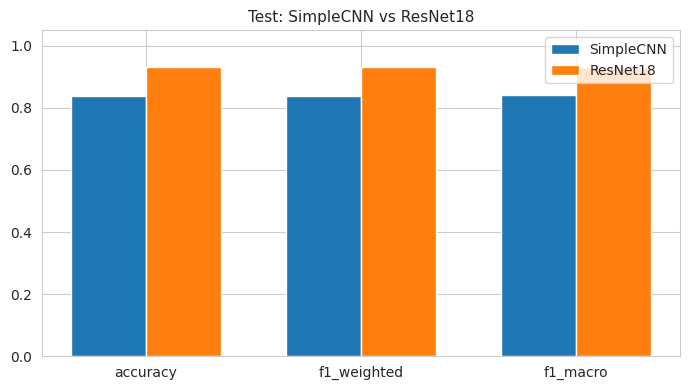

In [23]:
def flatten_table(table, model_name):
    out = table.copy()
    out["model"] = model_name
    return out.reset_index()


comparison = pd.concat(
    [flatten_table(cnn_table, "SimpleCNN"), flatten_table(resnet_table, "ResNet18")],
    ignore_index=True,
)
comparison = comparison.pivot(index="split", columns="model")
display(comparison.round(4))

test_cmp = comparison.loc["test", :]
fig, ax = plt.subplots(figsize=(7, 4))
labels = ["accuracy", "f1_weighted", "f1_macro"]
x = np.arange(len(labels))
w = 0.35
ax.bar(x - w / 2, [test_cmp[(m, "SimpleCNN")] for m in labels], w, label="SimpleCNN")
ax.bar(x + w / 2, [test_cmp[(m, "ResNet18")] for m in labels], w, label="ResNet18")
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylim(0, 1.05)
ax.set_title("Test: SimpleCNN vs ResNet18")
ax.legend()
plt.tight_layout()
plt.show()


## 10. Висновки

### Що зроблено
- Intel Image Classification на Kaggle GPU: `ImageFolder` + `DataLoader`, val 20% від `seg_train`, аугментація лише на train (flip + ColorJitter), 150×150 для CNN і 224×224 для ResNet.
- **Варіант A:** SimpleCNN (3× Conv+BN+ReLU+MaxPool → FC), Adam `lr=1e-3`, чекпоінт за val loss.
- **Варіант B:** ResNet18 ImageNet, freeze backbone + нова `fc` (6 епох), потім fine-tune `layer4` (4 епохи, менший lr).
- Метрики: accuracy, weighted/macro F1, confusion matrix; факт/прогноз на train, val і test.

### Результати (test)

| Модель | Accuracy | Weighted F1 | Macro F1 |
|---|---|---|---|
| SimpleCNN | **84.0%** | **0.840** | **0.842** |
| ResNet18 | **93.1%** | **0.931** | **0.932** |

Орієнтир умови: CNN 75–85% / F1 0.73–0.83; transfer learning 90–97% / 0.89–0.96. Обидві моделі влучили в діапазон: CNN біля верхньої межі, ResNet — у середині. Різниця на test **+9.1 в.п. accuracy**.

**SimpleCNN.** Найкращий val — епоха 9 (acc 83.2%). Train 87.2% vs test 84.0% — помірне перенавчання. Легкі класи: forest, sea. Важкі: glacier і mountain (F1 ~0.80).

**ResNet18.** Freeze дав ~91% val; fine-tune `layer4` підняв val до **93.2%** (чекпоінт за val loss 0.198). Train 98.3% vs test 93.1% — розрив після розморожування, але якість на test стабільна відносно val. Найбільший виграш там, де CNN плуталась: glacier/mountain (F1 ~0.89 vs ~0.80) і buildings (0.93 vs 0.82).

### Обмеження
- SimpleCNN неглибока, без skip-connection; після 3 pool карта 18×18 vs ResNet на 224×224.
- Аугментація слабка (flip + jitter).
- Немає scheduler; fine-tune лише `layer4`.
- Частина помилок у даних: на одному кадрі є і гора, і льодовик.

### Що покращити далі
1. Сильніша аугментація (`RandAugment`, `RandomErasing`) або Mixup/CutMix.
2. `CosineAnnealing` / ReduceLROnPlateau по val loss.
3. EfficientNet-B0 або ResNet50 замість ResNet18.
4. Поступове розморожування `layer3` → `layer4`.
5. TTA на тесті.
6. Окремий розбір неоднозначних glacier/mountain.
